## Universidad del Valle de Guatemala
## Laboratorio 7 - Data Science
### Integrantes:
#### Diego Arredondo - 19422
#### Julio Herrera - 19402

#### Repositorio:
https://github.com/arr19422/Lab-7-DS

#### Descripción:
Para este laboratorio se utiliza un dataset que nos ayudará a predecir si una persona tiene diabetes o no. En cuanto al modelo a utilizar, este laboratorio tiene el objetivo de generar varios modelos con Autogluon, un framework de AutoML que nos permite generar modelos de Machine Learning de manera automática. Una vez obtenida la predicción (columna "Outcome") se evaluará el rendimiento de los modelos entrenados y se seleccionará el mejor modelo, este puede ser usado efectivamente por profesionales de la salud como una ayuda para la detección de diabetes y comprender los factores que contribuyen a la enfermedad.

#### Dependencias:
Se recomienda utilizar un entorno virtual de Python para instalar las dependencias necesarias para este laboratorio.
Se recomienda instalar autogluon y que este instale las versiones que necesita de pandas, numpy y matplotlib.
Seaborn no es dependencia de autogluon, debe instalarse aparte.

In [33]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from autogluon.tabular import TabularDataset, TabularPredictor
%matplotlib inline

In [34]:
import warnings
warnings.filterwarnings('ignore')

##### Dataset
El dataset fue brindado en las instrucciones del laboratorio.´
 - Pregnancies:  Número de veces que ha estado embarazada
 - GlucosePlasma:  Concentración de glucosa
 - BloodPressure:  Presión de sangre diastólica (mm Hg)
 - Skin:  Grosor del pliegue cutáneo del Triscep (mm)
 - Insulin:  Suero de insulina 2-Horas (mu U/ml)
 - BMI:  Indice de masa corporal (peso en Kg/(estatura en mts)2)
 - DiabetesPedigreeFunction:  Función de pedigree de diabetes
 - Age:  Edad en años
 - Outcome:  Diabetes ó no diabetes (0 ó 1)

In [35]:
data = pd.read_csv('diabetes.csv')

#### Análisis Exploratorio de los Datos (EDA) 

Damos un vistazo rápido a las 3 primeras filas del dataset para ver cómo se ven los datos.

In [36]:
data.head(3)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1


Damos un vistazo rápido a las últimas 3 filas del dataset para ver cómo se ven los datos.

In [37]:
data.tail(3)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


#### Reporte de datos
Se utiliza Profile Report para obtener un resumen estadístico de los datos sobre cada variable como información general como cantidad de datos y datos faltantes en cada columna, tipo de variable, gráficos de distribución, correlaciones, etc.

In [38]:
profileReport = ProfileReport(data)
profileReport

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Gracias al Profile Report podemos ver que no hay datos faltantes en el dataset pero algunas variables tienen alto porcentaje de valores 0, en algunas de ellas es válido el valor 0 como en embarazos o en insulina ya que la prueba solo data de 2 horas. Sin embargo en otras variables como Glucose, BloodPressure, SkinThickness y BMI, el valor 0 no es válido por lo que deben considerarse como datos faltantes.

También vemos algunos valores atípicos como en embarazos donde hay registros con hasta 17 embarazos o SkinThickness de hasta 99.

Podemos realizar otras estadísticas descriptivas para obtener más información acerca de cada grupo (con diabetes y sin diabetes).

In [39]:
df_outcome = data.groupby(by='Outcome').mean()
df_outcome

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Outcome,,,,,,,,
0,3.298000,109.980000,68.184000,19.664000,68.792000,30.304200,0.429734,31.190000
1,4.865672,141.257463,70.824627,22.164179,100.335821,35.142537,0.550500,37.067164


### limpiando los datos

In [40]:
# Eliminando 0s en Glucose, BloodPressure, SkinThickness y BMI
data['Glucose'] = data['Glucose'].replace(0, np.nan)
data['BloodPressure'] = data['BloodPressure'].replace(0, np.nan)
data['SkinThickness'] = data['SkinThickness'].replace(0, np.nan)
data['BMI'] = data['BMI'].replace(0, np.nan)

# Eliminando valores nulos
data = data.dropna()

# Eliminando outliers
data = data[(data['Pregnancies'] <= 14) & (data['SkinThickness'] <= 53) & (data['Insulin'] <= 495)]

# Revisando cantidad de valores nulos
data.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

#### Revisualización de los datos sin valores faltantes ni atípicos

Primero vemos los histogramas de todas las variables para ver y comparar la nueva distribución con la vista en el reporte.

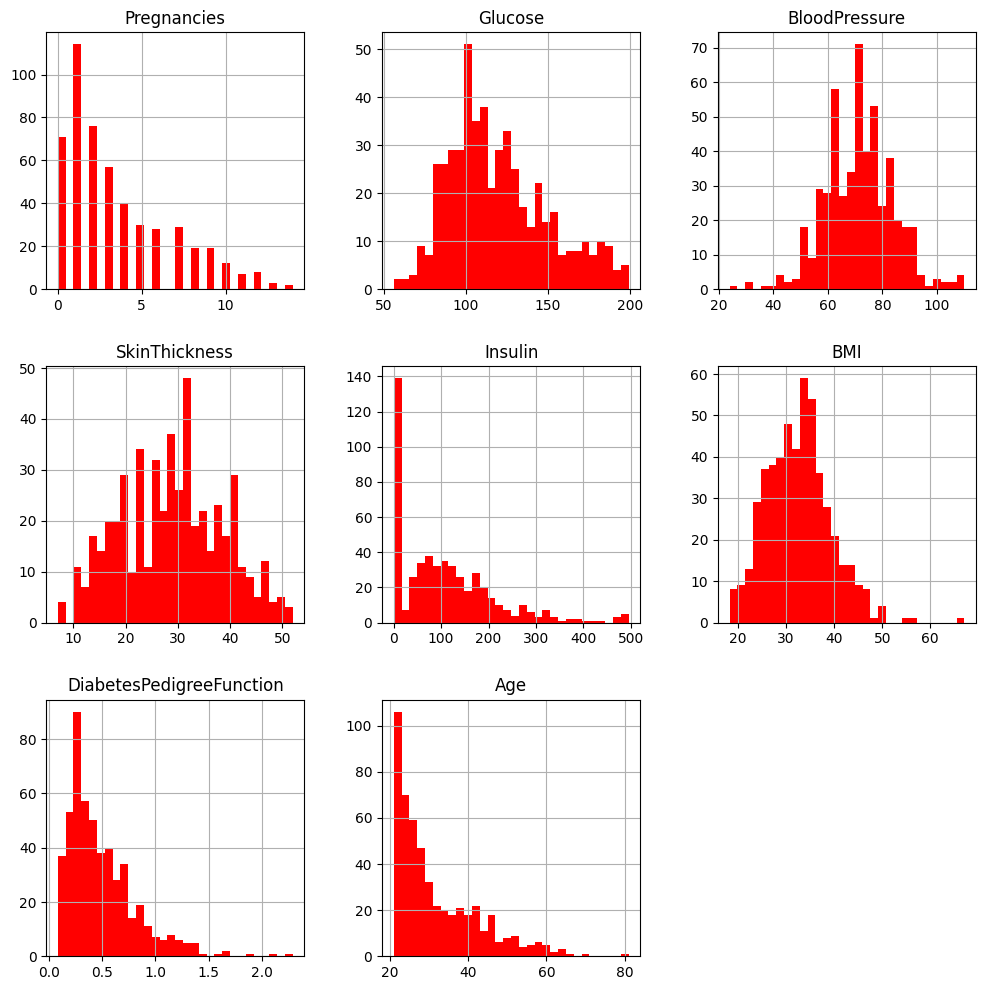

In [41]:
data[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].hist(bins = 30, figsize = (12, 12), color = 'r');
plt.show()

Realizamos un pairplot para ver si el dataset muestra ahora alguna gráfica de interés entre algún cruce de variables.

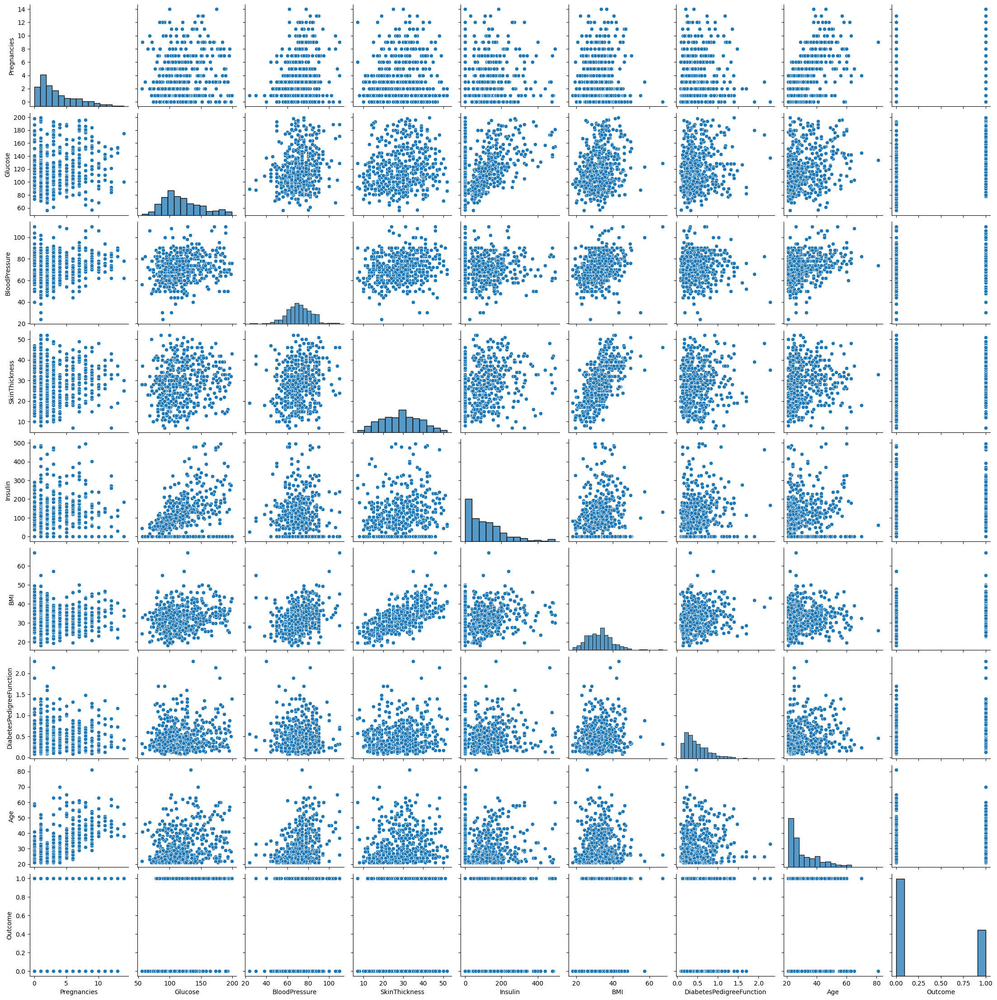

In [42]:
# realizar una gráfica pairplot

sns.pairplot(data)
plt.show()

A partir de este pairplot vemos como algunas variables sí están relacionadas y muestran un comportamiento lineal entre sí como Glucose e Insulin, SkinThickness y BMI, Pregnancies y Age.

En cuanto a Outcome se puede ver que existe una tendencia entre valores máximos y mínimos con las variables Glucose, Insulin, BMI y en menor cantidad se nota también con BloodPressure y DiabetesPedigreeFunction.

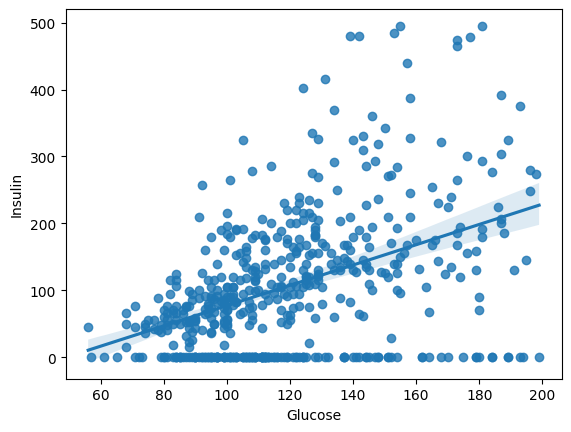

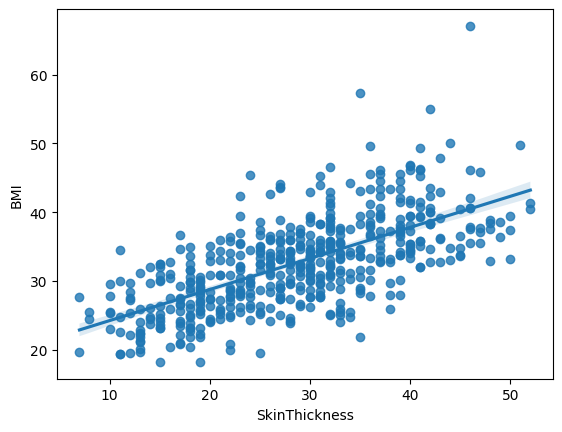

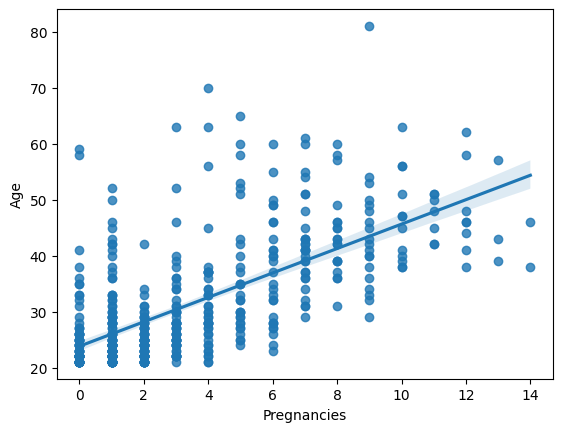

In [43]:
# multiple regplot
sns.regplot(x = 'Glucose', y = 'Insulin', data = data)
plt.show()
sns.regplot(x = 'SkinThickness', y = 'BMI', data = data)
plt.show()
sns.regplot(x = 'Pregnancies', y = 'Age', data = data)
plt.show()

Para ver de mejor manera la diferencia entre los 2 valores de Outcome, se realiza una grafica de caja y bigotes para cada valor de Outcome con las variables Glucose, Insulin, BMI, BloodPressure y DiabetesPedigreeFunction.
Esto nos permite ver en qué rango de valores se concentran los datos de cada grupo.

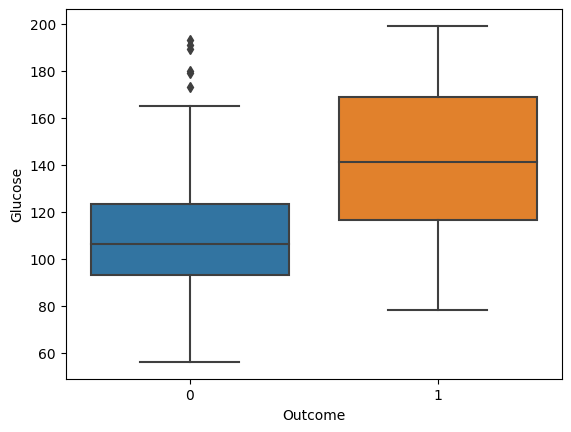

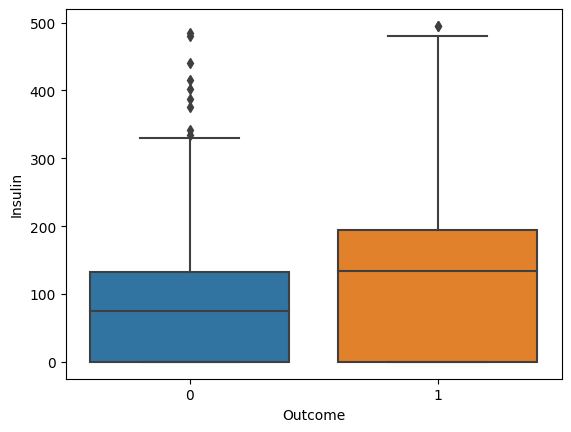

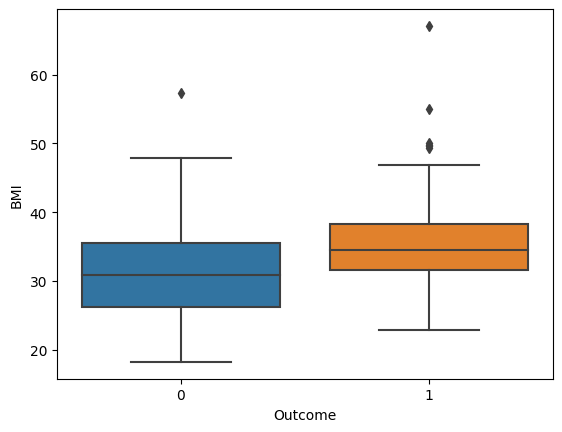

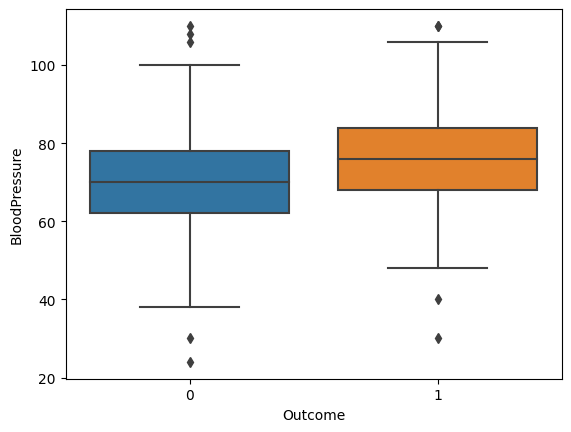

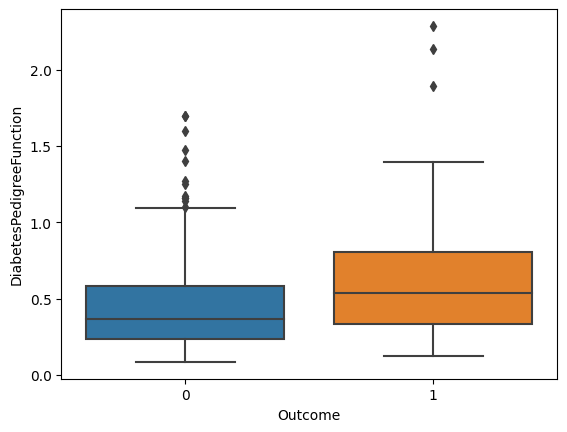

In [44]:
# grafica Glucose y Outcome
sns.boxplot(x = 'Outcome', y = 'Glucose', data = data)
plt.show()
sns.boxplot(x = 'Outcome', y = 'Insulin', data = data)
plt.show()
sns.boxplot(x = 'Outcome', y = 'BMI', data = data)
plt.show()
sns.boxplot(x = 'Outcome', y = 'BloodPressure', data = data)
plt.show()
sns.boxplot(x = 'Outcome', y = 'DiabetesPedigreeFunction', data = data)
plt.show()

### Entrenando los múltiples modelos con Autogluon

Como solo tenemos un dataset es necesario dividirlo en un conjunto de entrenamiento y otro de prueba. Para esto se utiliza la función train_test_split de sklearn.
El 80% de los datos se utilizarán para entrenar los modelos y el 20% restante para probarlos.

In [45]:
from sklearn.model_selection import train_test_split
X_entreno, X_prueba = train_test_split(data, test_size=0.2, random_state=0)

Revisando la parte de datos de entrenamiento

In [46]:
X_entreno

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
450,1,82.0,64.0,13.0,95,21.2,0.415,23,0
707,2,127.0,46.0,21.0,335,34.4,0.176,22,0
452,0,91.0,68.0,32.0,210,39.9,0.381,25,0
118,4,97.0,60.0,23.0,0,28.2,0.443,22,0
265,5,96.0,74.0,18.0,67,33.6,0.997,43,0
...,...,...,...,...,...,...,...,...,...
421,2,94.0,68.0,18.0,76,26.0,0.561,21,0
323,13,152.0,90.0,33.0,29,26.8,0.731,43,1
20,3,126.0,88.0,41.0,235,39.3,0.704,27,0
540,8,100.0,74.0,40.0,215,39.4,0.661,43,1


Revisando la parte de datos de prueba

In [47]:
X_prueba

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
429,1,95.0,82.0,25.0,180,35.0,0.233,43,1
160,4,151.0,90.0,38.0,0,29.7,0.294,36,0
63,2,141.0,58.0,34.0,128,25.4,0.699,24,0
77,5,95.0,72.0,33.0,0,37.7,0.370,27,0
662,8,167.0,106.0,46.0,231,37.6,0.165,43,1
...,...,...,...,...,...,...,...,...,...
467,0,97.0,64.0,36.0,100,36.8,0.600,25,0
568,4,154.0,72.0,29.0,126,31.3,0.338,37,0
94,2,142.0,82.0,18.0,64,24.7,0.761,21,0
293,1,128.0,48.0,45.0,194,40.5,0.613,24,1


Se entrenarán múltiples modelos ML de regresión utilizando AutoGluon

Es necesario especifcar la columna "etiqueta/meta/", datos de entreno, límite de tiempo, y pre-determinados

Nótese que AutoGluon detecta automáticamente si el problema es de clasificación o regresión basado en la columna "etiqueta"

Para problemas de tipo regresión, los valores de "etiqueta" son generalmente números de punto flotante con un gran número de valores únicos

In [48]:
predictor = TabularPredictor(label="Outcome", 
                             problem_type = 'binary', 
                             eval_metric = 'accuracy').fit(train_data = X_entreno, time_limit = 200, presets = "best_quality")

No path specified. Models will be saved in: "AutogluonModels/ag-20221007_203401\"
Presets specified: ['best_quality']
Stack configuration (auto_stack=True): num_stack_levels=0, num_bag_folds=5, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 200s
AutoGluon will save models to "AutogluonModels/ag-20221007_203401\"
AutoGluon Version:  0.5.2
Python Version:     3.8.0
Operating System:   Windows
Train Data Rows:    412
Train Data Columns: 8
Label Column: Outcome
Preprocessing data ...
Selected class <--> label mapping:  class 1 = 1, class 0 = 0
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    630.74 MB
	Train Data (Original)  Memory Usage: 0.03 MB (0.0% of available memory)
	Inferring data type of each feature based on column values. Set feature_metadata_in to manually specify special dtypes of the features.
	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
	Stage 2 Generators:
		Fitting

Ya con los modelos entrenados se saca un resumen con los modelos que fueron generados y sus valores de métricas.

In [49]:
predictor.fit_summary()

*** Summary of fit() ***
Estimated performance of each model:
                     model  score_val  pred_time_val  fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0      WeightedEnsemble_L2   0.796117       0.136539  1.024970                0.000537           0.141633            2       True          8
1  RandomForestGini_BAG_L1   0.791262       0.067001  0.565592                0.067001           0.565592            1       True          3
2    ExtraTreesEntr_BAG_L1   0.788835       0.069001  0.317745                0.069001           0.317745            1       True          6
3     LightGBMLarge_BAG_L1   0.786408       0.009002  1.412097                0.009002           1.412097            1       True          7
4    ExtraTreesGini_BAG_L1   0.779126       0.068007  0.318110                0.068007           0.318110            1       True          5
5  RandomForestEntr_BAG_L1   0.774272       0.074996  0.346004                0.074996      

{'model_types': {'KNeighborsUnif_BAG_L1': 'StackerEnsembleModel_KNN',
  'KNeighborsDist_BAG_L1': 'StackerEnsembleModel_KNN',
  'RandomForestGini_BAG_L1': 'StackerEnsembleModel_RF',
  'RandomForestEntr_BAG_L1': 'StackerEnsembleModel_RF',
  'ExtraTreesGini_BAG_L1': 'StackerEnsembleModel_XT',
  'ExtraTreesEntr_BAG_L1': 'StackerEnsembleModel_XT',
  'LightGBMLarge_BAG_L1': 'StackerEnsembleModel_LGB',
  'WeightedEnsemble_L2': 'WeightedEnsembleModel'},
 'model_performance': {'KNeighborsUnif_BAG_L1': 0.7305825242718447,
  'KNeighborsDist_BAG_L1': 0.7330097087378641,
  'RandomForestGini_BAG_L1': 0.7912621359223301,
  'RandomForestEntr_BAG_L1': 0.7742718446601942,
  'ExtraTreesGini_BAG_L1': 0.779126213592233,
  'ExtraTreesEntr_BAG_L1': 0.7888349514563107,
  'LightGBMLarge_BAG_L1': 0.7864077669902912,
  'WeightedEnsemble_L2': 0.7961165048543689},
 'model_best': 'WeightedEnsemble_L2',
 'model_paths': {'KNeighborsUnif_BAG_L1': 'AutogluonModels/ag-20221007_203401\\models\\KNeighborsUnif_BAG_L1\\',
 

Podemos ordenar los anteriores resultados, esta leaderboard muestra los modelos con los mejores valores de métricas de rendimiento.

In [50]:
predictor.leaderboard()

                     model  score_val  pred_time_val  fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0      WeightedEnsemble_L2   0.796117       0.136539  1.024970                0.000537           0.141633            2       True          8
1  RandomForestGini_BAG_L1   0.791262       0.067001  0.565592                0.067001           0.565592            1       True          3
2    ExtraTreesEntr_BAG_L1   0.788835       0.069001  0.317745                0.069001           0.317745            1       True          6
3     LightGBMLarge_BAG_L1   0.786408       0.009002  1.412097                0.009002           1.412097            1       True          7
4    ExtraTreesGini_BAG_L1   0.779126       0.068007  0.318110                0.068007           0.318110            1       True          5
5  RandomForestEntr_BAG_L1   0.774272       0.074996  0.346004                0.074996           0.346004            1       True          4
6    KNeighbo

,model,score_val,pred_time_val,fit_time,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,0.796117,0.136539,1.024970,0.000537,0.141633,2,True,8
1,RandomForestGini_BAG_L1,0.791262,0.067001,0.565592,0.067001,0.565592,1,True,3
2,ExtraTreesEntr_BAG_L1,0.788835,0.069001,0.317745,0.069001,0.317745,1,True,6
3,LightGBMLarge_BAG_L1,0.786408,0.009002,1.412097,0.009002,1.412097,1,True,7
4,ExtraTreesGini_BAG_L1,0.779126,0.068007,0.318110,0.068007,0.318110,1,True,5
5,RandomForestEntr_BAG_L1,0.774272,0.074996,0.346004,0.074996,0.346004,1,True,4
6,KNeighborsDist_BAG_L1,0.733010,0.009002,0.003000,0.009002,0.003000,1,True,2
7,KNeighborsUnif_BAG_L1,0.730583,0.008011,0.005931,0.008011,0.005931,1,True,1


Podemos también sacar una gráfica con estos valores de rendimiento para visualizar los mejores modelos.

                     model  score_val  pred_time_val  fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0      WeightedEnsemble_L2   0.796117       0.136539  1.024970                0.000537           0.141633            2       True          8
1  RandomForestGini_BAG_L1   0.791262       0.067001  0.565592                0.067001           0.565592            1       True          3
2    ExtraTreesEntr_BAG_L1   0.788835       0.069001  0.317745                0.069001           0.317745            1       True          6
3     LightGBMLarge_BAG_L1   0.786408       0.009002  1.412097                0.009002           1.412097            1       True          7
4    ExtraTreesGini_BAG_L1   0.779126       0.068007  0.318110                0.068007           0.318110            1       True          5
5  RandomForestEntr_BAG_L1   0.774272       0.074996  0.346004                0.074996           0.346004            1       True          4
6    KNeighbo

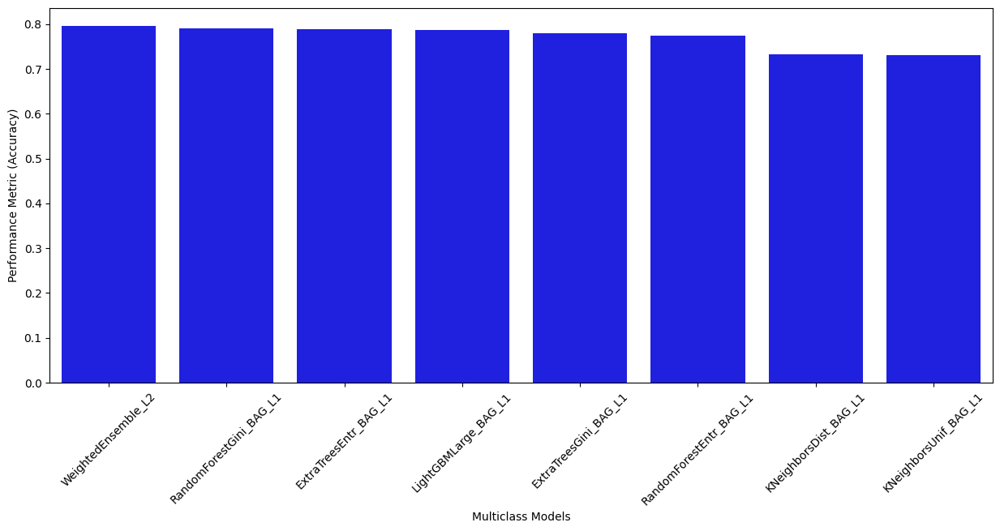

In [51]:
f, ax = plt.subplots(figsize = (15, 6))
sns.barplot(x = "model", y = "score_val", data = predictor.leaderboard(), color = "b")
ax.set(ylabel = "Performance Metric (Accuracy)", xlabel = "Multiclass Models")
plt.xticks(rotation = 45);

Como resultado de esta gráfica podemos observar que en realidad todos los modelos son buenos prediciendo la variable Outcome, pero los mejores son los modelos WeightedEnsemble_L2, LightGBMXT_BAG_L1, LightGBM_BAG_L1, NeuralNetTorch_BAG_L1 y CatBoost_BAG_L1. Estos con un score mayor a 80%.

#### Usando datos de prueba
Es momento de utilizar los modelos generados y entrenados para predecir los valores de Outcome en el dataset de prueba.

In [52]:
predictor.evaluate(X_prueba)

Evaluation: accuracy on test data: 0.7572815533980582
Evaluations on test data:
{
    "accuracy": 0.7572815533980582,
    "balanced_accuracy": 0.671689497716895,
    "mcc": 0.37461647385244007,
    "roc_auc": 0.8180365296803653,
    "f1": 0.5283018867924527,
    "precision": 0.6086956521739131,
    "recall": 0.4666666666666667
}


{'accuracy': 0.7572815533980582,
 'balanced_accuracy': 0.671689497716895,
 'mcc': 0.37461647385244007,
 'roc_auc': 0.8180365296803653,
 'f1': 0.5283018867924527,
 'precision': 0.6086956521739131,
 'recall': 0.4666666666666667}

Con ello se pueden ya realizar las predicciones de los valores de la columna Outcome en el dataset de prueba.
Para ver y comparar algunas de estas predicciones con sus valores reales se toman 15 registros de las predicciones y del dataset de prueba.

In [53]:
y_pred = predictor.predict(X_prueba)
print("Predictions:  ", list(y_pred)[:15])
print("Actual Labels:", list(X_prueba['Outcome'].values)[:15])

Predictions:   [0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]
Actual Labels: [1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]


Vemos que entre estas 5 pruebas, la predicción del primer registro no es correcta, esto es considerable ya que la eficiencia del modelo tampoco es tan alta como para que todas las predicciones sean correctas.

También podemos graficar los valores predichos vs los valores reales para ver la diferencia entre ambos.

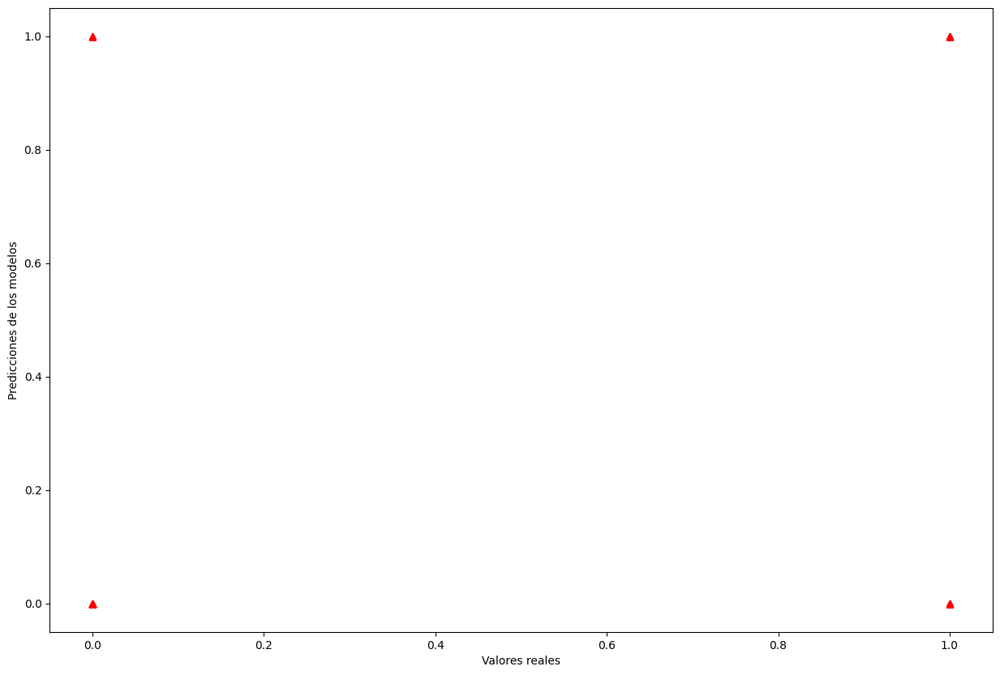

In [54]:
y_predicc = predictor.predict(X_prueba)
y_prueba = X_prueba['Outcome']
plt.figure(figsize = (15, 10))
plt.plot(y_prueba, y_predicc, "^", color = 'r')
plt.ylabel('Predicciones de los modelos')
plt.xlabel('Valores reales')
plt.show()

#### Métricas de rendimiento
Para evaluar el modelo pero con otras métricas de rendimiento se pueden utilizar las funciones de métricas de sklearn.
En este caso se utilizarán las métricas de RMSE (Root Mean Squared Error) y MSE (Mean Squared Error), MAE (Mean Absolute Error) y R2 (R-squared).

In [55]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from math import sqrt

RMSE = float(format(np.sqrt(mean_squared_error(y_prueba, y_predicc)),'.3f'))
MSE = mean_squared_error(y_prueba, y_predicc)
MAE = mean_absolute_error(y_prueba, y_predicc)
r2 = r2_score(y_prueba, y_predicc)
accuracy = accuracy_score(y_prueba, y_predicc)
precision = precision_score(y_prueba, y_predicc)
recall = recall_score(y_prueba, y_predicc)
f1 = f1_score(y_prueba, y_predicc)

print('RMSE =',RMSE, '\nMSE =',MSE, '\nMAE =',MAE, '\nR2 =', r2)
print('Accuracy =', accuracy, '\nPrecision =', precision, '\nRecall =', recall, '\nF1 =', f1)

RMSE = 0.493 
MSE = 0.24271844660194175 
MAE = 0.24271844660194175 
R2 = -0.17579908675799105
Accuracy = 0.7572815533980582 
Precision = 0.6086956521739131 
Recall = 0.4666666666666667 
F1 = 0.5283018867924527


En este caso R2 nos dice el porcentaje de las features que el modelo puede "explicar". Sin embargo la gráfica anterior no nos permite apreciar correctamente la cantidad de datos que se encuentran en cada valor de predicciones y datos reales, por lo que esto es mejor verlo en una matriz de confusión.

Para este modelo de clasificación binaria es mejor evaluar utilizando métricas como Accuracy, Precision, Recall y F1-score.

Confusion Matrix = [[64  9]
 [16 14]]


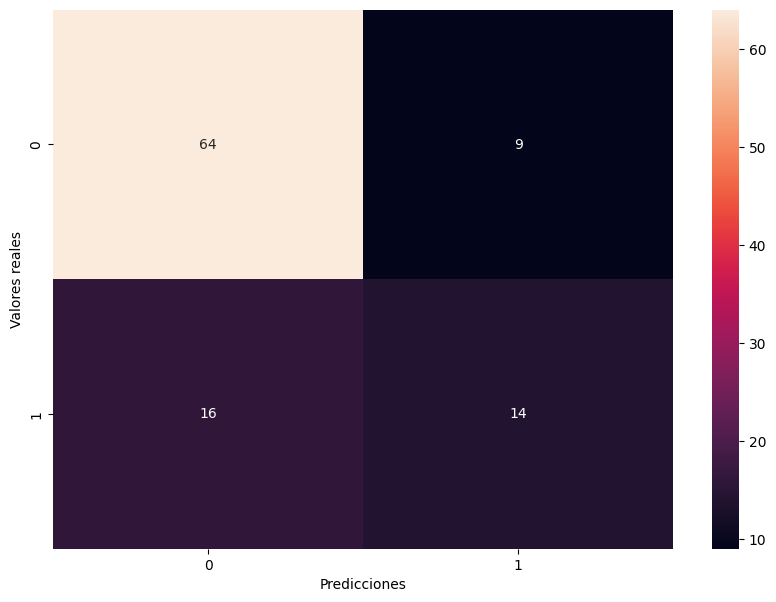

In [56]:
# Matriz de confusión
cm = confusion_matrix(y_prueba, y_predicc)
print('Confusion Matrix =', cm)
# Grafica matriz de confusión
plt.figure(figsize = (10, 7))
sns.heatmap(cm, annot = True)
plt.xlabel('Predicciones')
plt.ylabel('Valores reales')
plt.show()

Viendo esta matriz de confusión podemos observar que el modelo tiene buena predicción de Verdaderos negativos y tiene buenos Verdaderos positivos sobre los falsos. Pero aún así hay una cantidad considerable de falsos positivos (17) sobre verdaderos positivos (13).

En conclusión el modelo generado por Autogloun es bueno para predecir la variable Outcome, pero no es perfecto. Esto se puede ver en las métricas de rendimiento y en la matriz de confusión. Sin embargo, el objetivo de usar este paquete no es obtener el modelo perfecto directamente sino comparar entre muchos modelos para ver cuál es el mejor para nuestro problema y partir de ahí para adentrarnos más a fondo con dicho modelo y empezar a optimizarlo cambiando parámetros, etapas, learning rate, etc. según las capacidades del modelo.